In [1]:
setwd("/lustre1/project/stg_00041/XuanAi/EXMC_2021_2022/Archive/timecourse_naive2TSCs_EXMCs")

# Libraries

In [2]:
suppressMessages(library(Seurat))
suppressMessages(library(ggplot2))
suppressMessages(library(patchwork))
set.seed(1234)

Warning message:
“package ‘Seurat’ was built under R version 4.1.2”


In [3]:
suppressMessages(library(Matrix))

In [4]:
suppressMessages(library(dplyr))
#suppressMessages(library(tidyverse))

In [5]:
library(tibble)
#library(wesanderson)

Warning message:
“package ‘tibble’ was built under R version 4.1.1”


In [6]:
library(viridis)

Loading required package: viridisLite



In [7]:
library(tidyr)


Attaching package: ‘tidyr’


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack




In [8]:
library(RColorBrewer)

In [9]:
library(plotly)

Warning message:
“package ‘plotly’ was built under R version 4.1.1”

Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




In [10]:
library("stringr")

In [15]:
xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_mtx<-read.csv( "Messmer_Petropoulos_Zhou_Xiang_Tyser_VPD30_tc_RACL_NACL_mtx.csv", row.names = 1)

In [23]:
head(xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_mtx)
dim(xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_mtx)

,D10_IVC4_E1_B1_10,D10_IVC4_E1_B1_11,D10_IVC4_E1_B1_12,D10_IVC4_E1_B1_13,D10_IVC4_E1_B1_14,D10_IVC4_E1_B1_15,D10_IVC4_E1_B1_16,D10_IVC4_E1_B1_18,D10_IVC4_E1_B1_19,D10_IVC4_E1_B1_1,⋯,TGCGGGTCAGCCTTCT.1,TTCACCGGTCCGACGT.1,TTCAGGACACTAGGCC.1,TTCGCTGAGCCTCTCT.1,TTCGGTCCAAGTTCCA.1,TTGAGTGGTGATACTC.1,TTGCTGCCACTAACCA.1,TTGGGTAGTCAATGGG.1,TTGTTCAAGCACTAAA.1,TTTGATCGTCATTCCC.1
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
DDX11L1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
WASH7P,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MIR6859-1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4G4P,0,0,0,0,0,1,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4G11P,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 87569 24351

In [11]:
xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_anno<-read.csv("Messmer_Petropoulos_Zhou_Xiang_Tyser_VPD30_tc_RACL_NACL_annotation.csv", row.names = 1)

In [22]:
head(xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_anno)
dim(xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_anno)

,orig.ident.x,nCount_RNA,nFeature_RNA,cell_name,orig.ident.y,finalClusters,Experiment,finalClusters.old.Xiang,RNA_snn_res.0.5,seurat_clusters,Day,finalClusters_v2,integrated_snn_res.1.5,Day.finalClusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>
D10_IVC4_E1_B1_10,integration,788590,10072,D10_IVC4_E1_B1_10,integration,TB.medium2,Zhou,TB.medium2,3,13,D10,TB.medium2,13,TB.medium2
D10_IVC4_E1_B1_11,integration,46029,3923,D10_IVC4_E1_B1_11,integration,unknown,Zhou,unknown,4,13,D10,unknown,13,unknown
D10_IVC4_E1_B1_12,integration,146063,7508,D10_IVC4_E1_B1_12,integration,TB.late,Zhou,TB.late,3,13,D10,TB.late,13,TB.late
D10_IVC4_E1_B1_13,integration,1262641,10042,D10_IVC4_E1_B1_13,integration,Pre.ST,Zhou,Pre.ST,4,15,D10,Pre.ST,15,Pre.ST
D10_IVC4_E1_B1_14,integration,24702,3347,D10_IVC4_E1_B1_14,integration,unknown,Zhou,unknown,4,15,D10,unknown,15,Pre.EVT
D10_IVC4_E1_B1_15,integration,2358380,12107,D10_IVC4_E1_B1_15,integration,TB.late,Zhou,TB.late,4,15,D10,TB.late,15,TB.late


[1] 24351    14

In [14]:
table(xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_anno$Day)


         CS7           D0           D1          D10          D12          D13 
        1195         1509         2008         1785          941          435 
         D14          D18           D2           D3           D4           D5 
         674         3246         2306           81         2059          375 
          D6           D7          D70           D8           D9         NACL 
        1210          531         1356         2371           68           75 
       naive     naive_VP       primed     primed_1         RACL       TSC_VP 
         431           64          474          396          593           31 
undefined_VP 
         137 

In [ ]:
## create a seurat object

In [18]:
so_xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE<- CreateSeuratObject(
  counts = xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_mtx,
  project = "integration", 
  min.cells = 0,
  min.features = 0)

In [19]:
so_xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE@meta.data<- xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE_anno

In [21]:
head(so_xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE@meta.data)

,orig.ident.x,nCount_RNA,nFeature_RNA,cell_name,orig.ident.y,finalClusters,Experiment,finalClusters.old.Xiang,RNA_snn_res.0.5,seurat_clusters,Day,finalClusters_v2,integrated_snn_res.1.5,Day.finalClusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<int>,<chr>
D10_IVC4_E1_B1_10,integration,788590,10072,D10_IVC4_E1_B1_10,integration,TB.medium2,Zhou,TB.medium2,3,13,D10,TB.medium2,13,TB.medium2
D10_IVC4_E1_B1_11,integration,46029,3923,D10_IVC4_E1_B1_11,integration,unknown,Zhou,unknown,4,13,D10,unknown,13,unknown
D10_IVC4_E1_B1_12,integration,146063,7508,D10_IVC4_E1_B1_12,integration,TB.late,Zhou,TB.late,3,13,D10,TB.late,13,TB.late
D10_IVC4_E1_B1_13,integration,1262641,10042,D10_IVC4_E1_B1_13,integration,Pre.ST,Zhou,Pre.ST,4,15,D10,Pre.ST,15,Pre.ST
D10_IVC4_E1_B1_14,integration,24702,3347,D10_IVC4_E1_B1_14,integration,unknown,Zhou,unknown,4,15,D10,unknown,15,Pre.EVT
D10_IVC4_E1_B1_15,integration,2358380,12107,D10_IVC4_E1_B1_15,integration,TB.late,Zhou,TB.late,4,15,D10,TB.late,15,TB.late


# Integration time course naive to TSC conversion and PrE differentiation with single-cell human embryo data set with fast integration

In [ ]:
so_hum.list <- SplitObject(so_xiang_Messmer_Pet_Zhou_Tyser_VP1_VPtc_PrE, split.by = "Experiment")
so_hum.list

In [ ]:
for (i in c(1,2,3,4,5,7,8)){
so_hum.list[[i]]<- NormalizeData(so_hum.list[[i]], verbose =FALSE)
so_hum.list [[i]]<- FindVariableFeatures(so_hum.list[[i]], verbose = FALSE)
}
so_hum.list[[6]]<- so_hum.list[[6]]
so_hum.list[[6]]<- FindVariableFeatures(so_hum.list[[6]], verbose = FALSE)

In [ ]:
features <- SelectIntegrationFeatures(object.list = so_hum.list)
so_hum.list <- lapply(X = so_hum.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE, approx=FALSE)
})

In [ ]:
# using Messmer, Zhou, Pet, Xiang and Tyser as reference data
so_hum.anchors <- FindIntegrationAnchors(object.list = so_hum.list, reference = c(1,2,3,5,6), reduction = "rpca", dims = 1:50)
so_hum.combined <- IntegrateData(anchorset = so_hum.anchors, dims = 1:50)


In [ ]:
DefaultAssay(so_hum.combined) <- "integrated"

In [ ]:
# Run the standard workflow for visualization and clustering
so_hum.combined <- ScaleData(so_hum.combined, verbose = FALSE)
so_hum.combined <- RunPCA(so_hum.combined, verbose = FALSE)

so_hum.combined <- RunUMAP(so_hum.combined, reduction = "pca", dims = 1:30)
so_hum.combined <- FindNeighbors(so_hum.combined, reduction = "pca", dims = 1:30)

In [ ]:
so_hum.combined <- FindClusters(so_hum.combined, resolution = 1.5)

In [112]:
so_hum.combined$Day.finalClusters[which(so_hum.combined$Day.finalClusters=="D5.Epiblast"|so_hum.combined$Day.finalClusters=="D6.Epiblast"|so_hum.combined$Day.finalClusters=="D7.Epiblast")]<- "Peimplantation Epiblast"
so_hum.combined$Day.finalClusters[which(so_hum.combined$Day.finalClusters=="D8.Epiblast"|so_hum.combined$Day.finalClusters=="D9.Epiblast"|so_hum.combined$Day.finalClusters=="D10.Epiblast")]<- "Intermediate Epiblast"
so_hum.combined$Day.finalClusters[which(so_hum.combined$Day.finalClusters=="D12.Epiblast"|so_hum.combined$Day.finalClusters=="D14.Epiblast"|so_hum.combined$Day.finalClusters=="CS7.Epiblast")]<- "Postimplantation Epiblast"

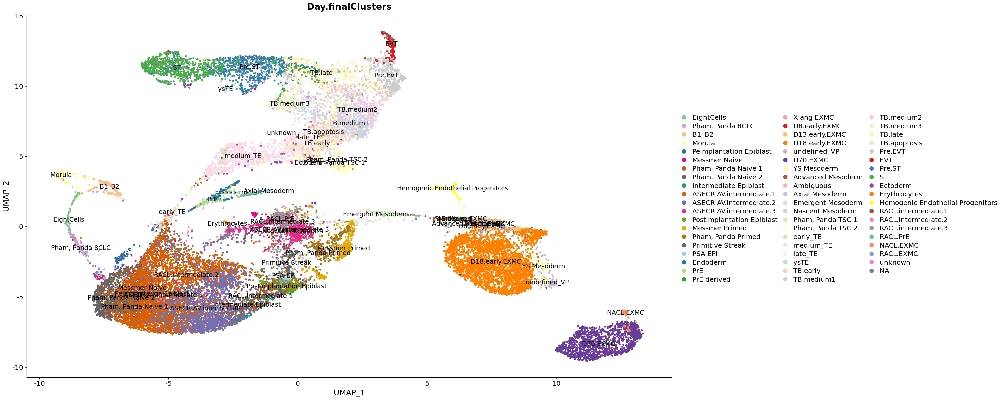

In [119]:
# Visualization
options(repr.plot.width=25, repr.plot.height=10)
p<-DimPlot(so_hum.combined, reduction = "umap",  label = T, pt.size=1, group.by= "Day.finalClusters", cols = col_vector)
p

In [120]:
pdf("/lustre1/project/stg_00041/XuanAi/Timecourse_Naive_TSCs/Figures/RACL_NACL/UMAP_integration_humanEmbryo_VP30_VPtc_PrE_20220524.pdf", height= 10, width=25)
plot(p)
dev.off()

png 
  2

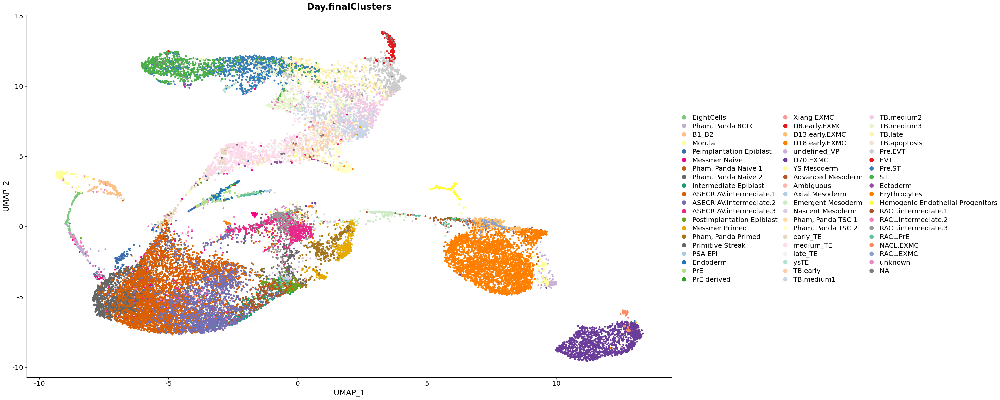

In [121]:
# Visualization
options(repr.plot.width=25, repr.plot.height=10)
p<-DimPlot(so_hum.combined, reduction = "umap",  pt.size=1, group.by= "Day.finalClusters", cols = col_vector)
p

In [122]:
pdf("Figures/Fig6H_UMAP_integration_humanEmbryo_VP30_VPtc_PrE_NoLabel.pdf", height= 10, width=25)
plot(p)
dev.off()

png 
  2

## Remove PrE differentiation from master integration

In [93]:
Idents(so_hum.combined)<- so_hum.combined$Experiment

In [94]:
so_VPtc_VPD30_HMembryo.combined<- subset(so_hum.combined, idents = c("Messmer", "Pet", "tc_XA", "Tyser", "VP", "xiang", "Zhou"))

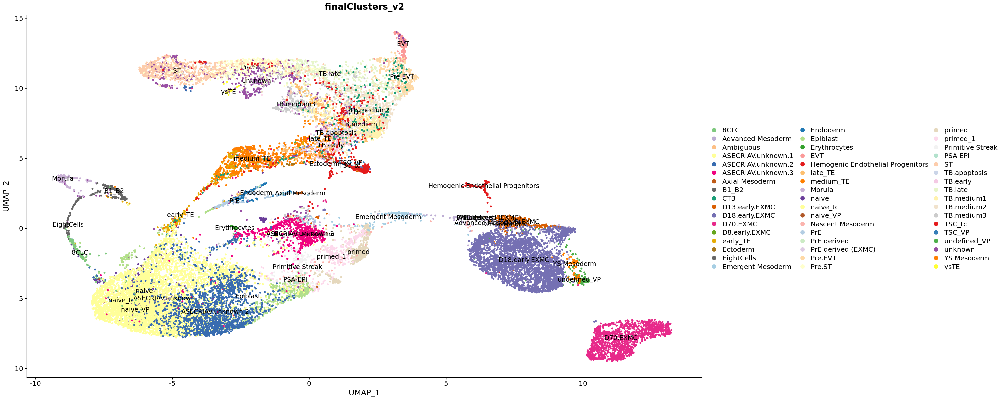

In [95]:
# Visualization
options(repr.plot.width=25, repr.plot.height=10)
p<-DimPlot(so_VPtc_VPD30_HMembryo.combined, reduction = "umap",  label = T, pt.size=1, group.by= "finalClusters_v2", cols = col_vector)
p

In [68]:
levels = c("EightCells","8CLC",# "D0.8CLC", "D1.8CLC","D2.8CLC", "D4.8CLC", "D8.8CLC",  "D13.8CLC", 
            "B1_B2","Morula", "naive_Epiblast(D5,6,7)","naive", "naive_VP", "naive_tc", "Intermediate_Epiblast(D8,9,10)","ASECRIAV.unknown.1", "ASECRIAV.unknown.2", "ASECRIAV.unknown.3","primed_Epiblast(D12,14,CS7)", "primed", "primed_1", "Primitive Streak", "PSA-EPI", #"D0.naive_tc", "D1.naive_tc", "D8.naive_tc"
          #"D0.unknown.2", "D0.unknown.3", "D1.unknown.1", "D1.unknown.2", "D1.unknown.3","D2.unknown.1","D2.unknown.2","D2.unknown.3",  "D4.unknown.1", "D4.unknown.2", "D4.unknown.3", "D8.unknown.1", "D8.unknown.2", "D8.unknown.3",   "D13.unknown.1", "D13.unknown.2", "D18.unknown.3", 
             "Endoderm", "PrE", "PrE derived", "PrE derived (EXMC)", 
          "D8.early.EXMC", "D13.early.EXMC","D18.early.EXMC","undefined_VP",  "D70.EXMC", "YS Mesoderm",  "Advanced Mesoderm","Ambiguous","Axial Mesoderm" , "Emergent Mesoderm", "Nascent Mesoderm", 
          #"D0.TSC_tc", "D1.TSC_tc", "D2.TSC_tc","D4.TSC_tc",  "D8.TSC_tc", "D13.TSC_tc", "D18.TSC_tc", 
          "TSC_tc", "TSC_VP", 
          "early_TE","medium_TE", "late_TE","ysTE", "TB.early","TB.medium1", "TB.medium2","TB.medium3",  "TB.late",  "TB.apoptosis", "Pre.EVT",  "EVT", "Pre.ST", "ST", 
         "Ectoderm","Erythrocytes", "Hemogenic Endothelial Progenitors", "unknown")




In [261]:
so_VPtc_VPD30_HMembryo.combined$finalClusters_v2<- factor(so_VPtc_VPD30_HMembryo.combined$finalClusters_v2, levels= levels)

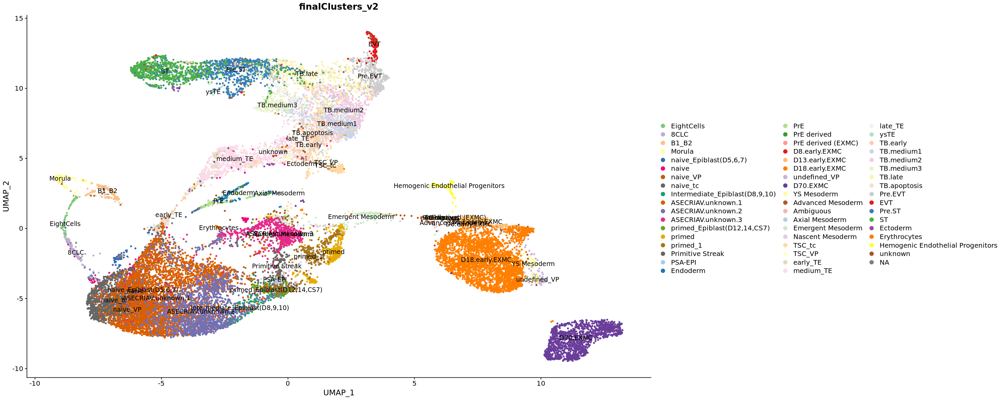

In [263]:
# Visualization
options(repr.plot.width=25, repr.plot.height=10)
p<-DimPlot(so_VPtc_VPD30_HMembryo.combined, reduction = "umap",  label = T, pt.size=1, group.by= "finalClusters_v2", cols = col_vector)
p

In [264]:
pdf("Figures/FigS5A_UMAP_integration_VPtc_VPD30_HMembryo.pdf", width = 25, height = 10)
plot(p)
dev.off()

png 
  2

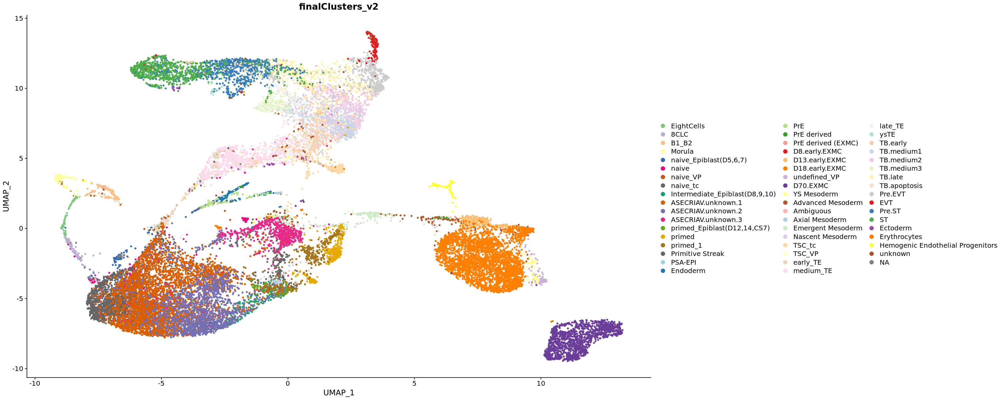

In [339]:
# Visualization
options(repr.plot.width=25, repr.plot.height=10)
p<-DimPlot(so_VPtc_VPD30_HMembryo.combined, reduction = "umap",  pt.size=1, group.by= "finalClusters_v2", cols = col_vector)
p

In [96]:
Idents(so_VPtc_VPD30_HMembryo.combined)<- so_VPtc_VPD30_HMembryo.combined$finalClusters_v2

In [97]:
table(so_VPtc_VPD30_HMembryo.combined$finalClusters_v2)


                             8CLC                 Advanced Mesoderm 
                              137                               164 
                        Ambiguous                ASECRIAV.unknown.1 
                                8                              3786 
               ASECRIAV.unknown.2                ASECRIAV.unknown.3 
                             1706                               637 
                   Axial Mesoderm                             B1_B2 
                               23                               175 
                              CTB                    D13.early.EXMC 
                              198                               312 
                   D18.early.EXMC                          D70.EXMC 
                             3194                              1356 
                    D8.early.EXMC                          early_TE 
                                3                               269 
                         Ectoderm

In [271]:
EightCLC <- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("8CLC"))
EightCells <- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("EightCells"))
ASECRIAV.intermediate.1<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("ASECRIAV.unknown.1"))
ASECRIAV.intermediate.2<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("ASECRIAV.unknown.2"))
ASECRIAV.intermediate.3<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("ASECRIAV.unknown.3"))
naive_tc<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("naive_tc"))
naive_Epiblast<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("naive_Epiblast(D5,6,7)"))
Intermediate_Epiblast<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("Intermediate_Epiblast(D8,9,10)"))
primed_Epiblast<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("primed_Epiblast(D12,14,CS7)"))
D8.early.EXMC <- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("D8.early.EXMC"))
D13.early.EXMC<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("D13.early.EXMC"))
D18.early.EXMC<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("D18.early.EXMC"))
D70<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("D70.EXMC"))
TSC_tc<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("TSC_tc"))
TSC_VP<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("TSC_VP"))
TB_early<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("TB.early"))

In [272]:
D30.EXMC<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("undefined_VP"))

In [273]:
PrE_derived<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("PrE derived"))
PrE_derived_EXMC<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("PrE derived (EXMC)"))
tyser_EXMC<- WhichCells(so_VPtc_VPD30_HMembryo.combined, idents = c("YS Mesoderm"))

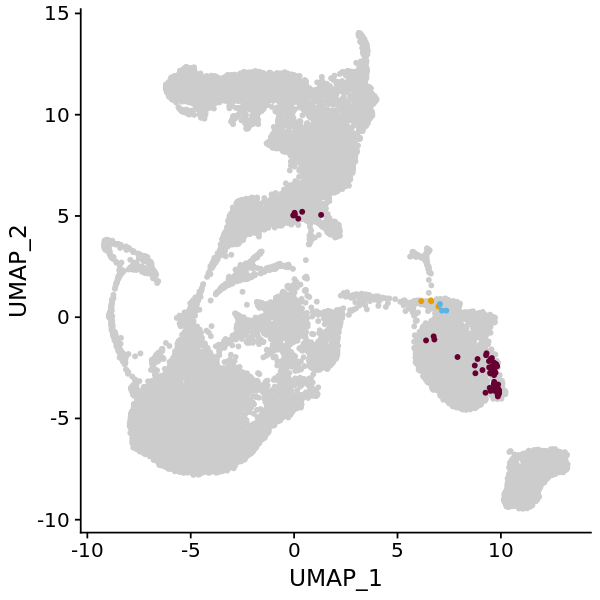

In [321]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(D8.early.EXMC,PrE_derived_EXMC,  tyser_EXMC ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [322]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_D8EXMC.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

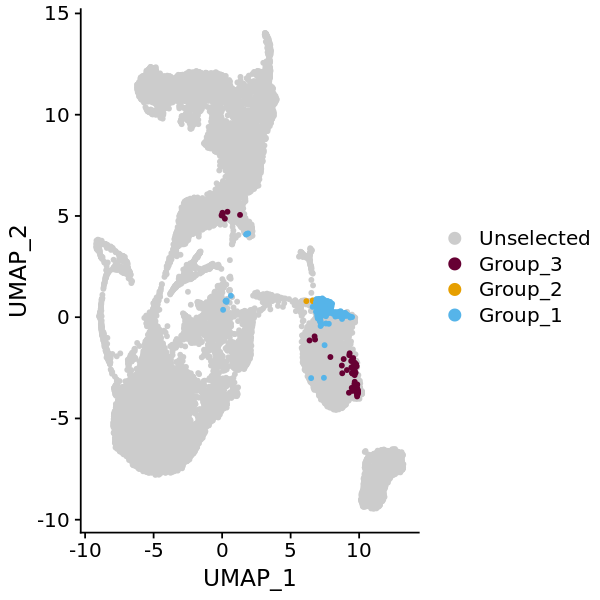

In [323]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(D13.early.EXMC,PrE_derived_EXMC, tyser_EXMC  ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9"  ) ,pt.size =1,  label.size = 0.5, cols= "grey80")
                                   
Plot1

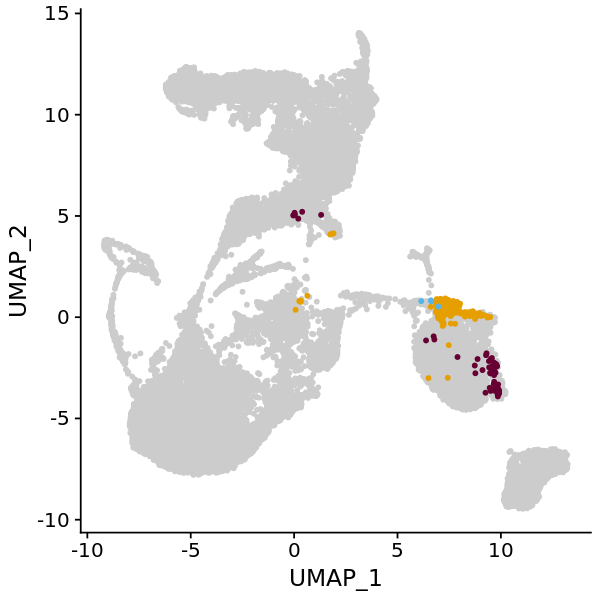

In [341]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(PrE_derived_EXMC,D13.early.EXMC,  tyser_EXMC  ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9"  ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [342]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_D13EXMC.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

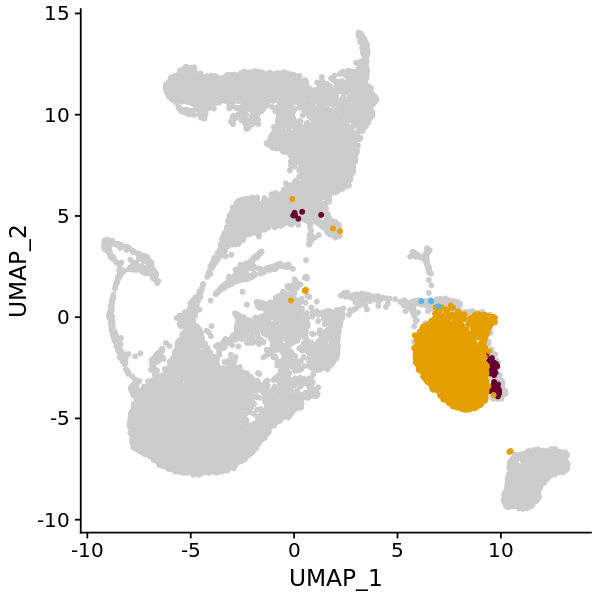

In [343]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(PrE_derived_EXMC,D18.early.EXMC ,   tyser_EXMC ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9"  ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [344]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_D18EXMC.pdf", width = 5, height =5)
plot(Plot1)
dev.off()

png 
  2

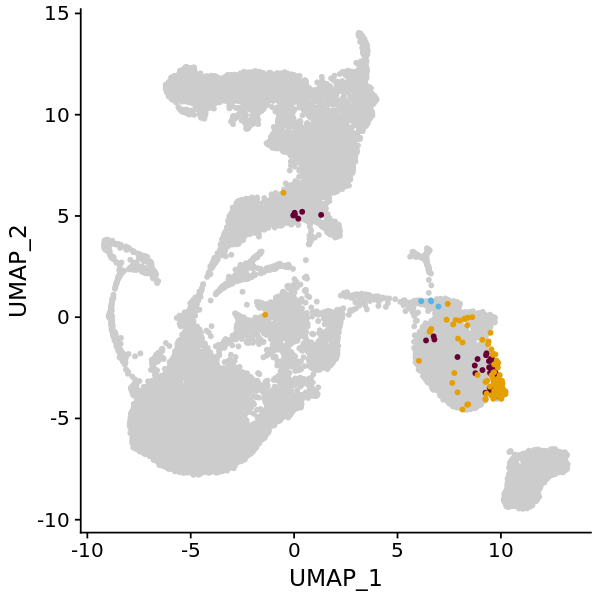

In [345]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(PrE_derived_EXMC,D30.EXMC ,   tyser_EXMC ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9"  ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [346]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_D30EXMC.pdf", width = 5, height =5)
plot(Plot1)
dev.off()

png 
  2

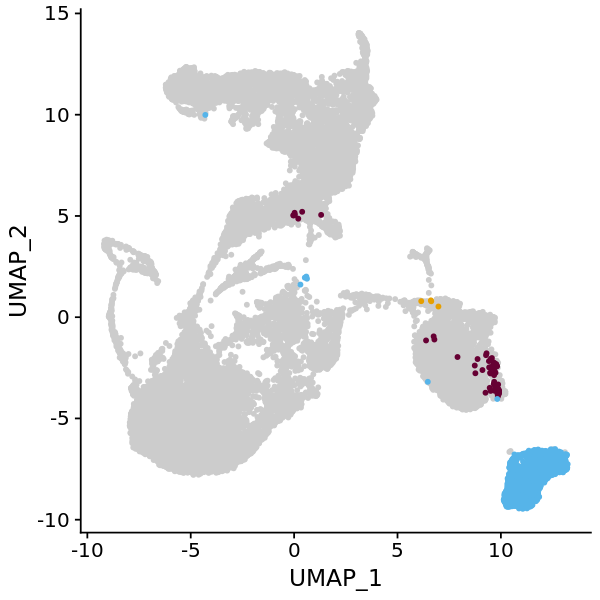

In [328]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list(D70, PrE_derived_EXMC,tyser_EXMC  ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [329]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_D70.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

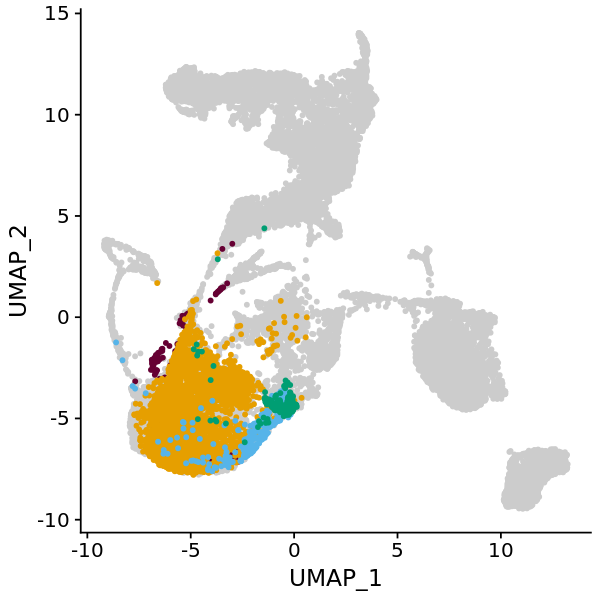

In [330]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list( primed_Epiblast, Intermediate_Epiblast,ASECRIAV.intermediate.1, naive_Epiblast ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" , "#009E73" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [331]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_ASECRIAV.intermediate.1.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

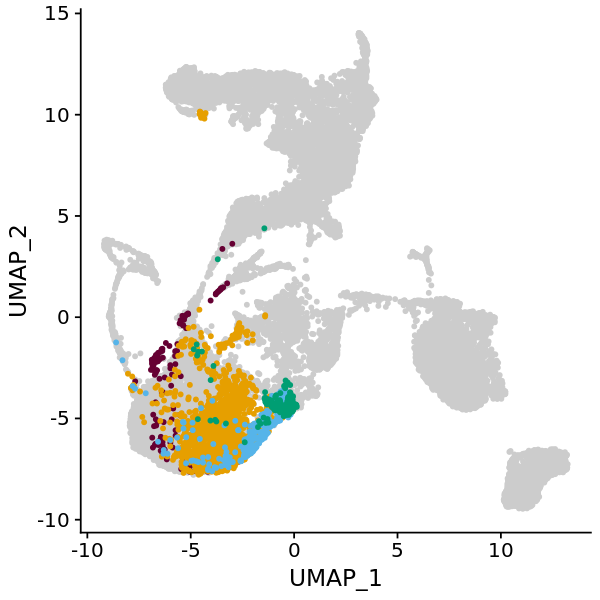

In [332]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list( primed_Epiblast, Intermediate_Epiblast,ASECRIAV.intermediate.2, naive_Epiblast ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" , "#009E73" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [333]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_ASECRIAV.intermediate.2.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

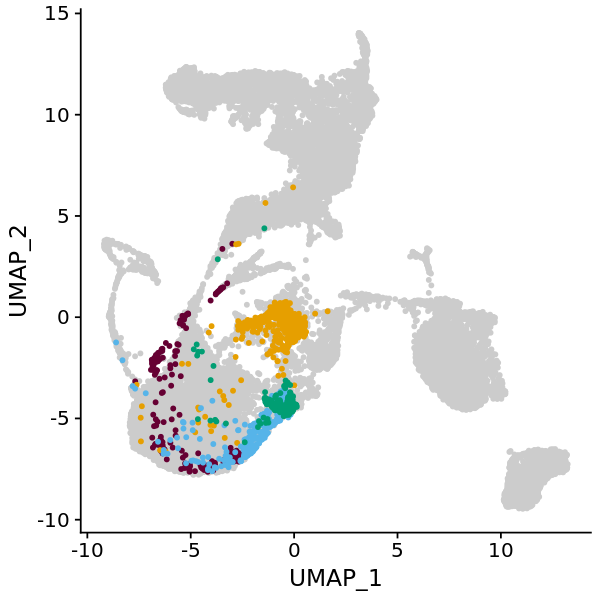

In [315]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list( primed_Epiblast, Intermediate_Epiblast,ASECRIAV.intermediate.3, naive_Epiblast ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" , "#009E73" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [316]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_ASECRIAV.intermediate.3.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

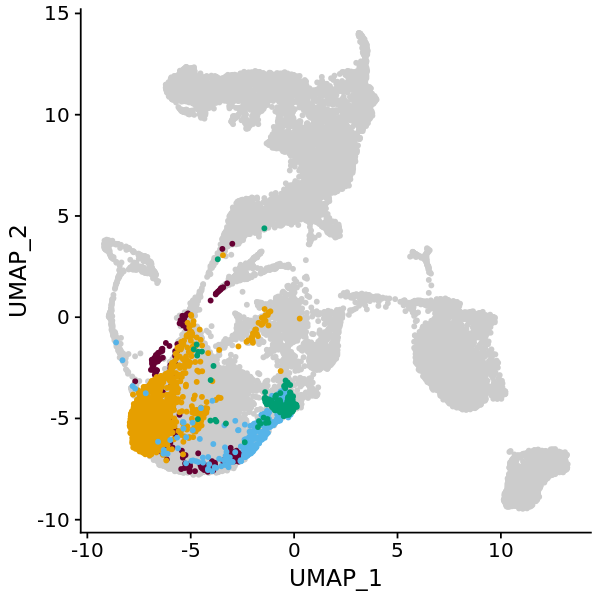

In [317]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list( primed_Epiblast, Intermediate_Epiblast,naive_tc, naive_Epiblast ),
                cols.highlight = c("#660033","#E69F00" , "#56B4E9" , "#009E73" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [318]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_naive_tc.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

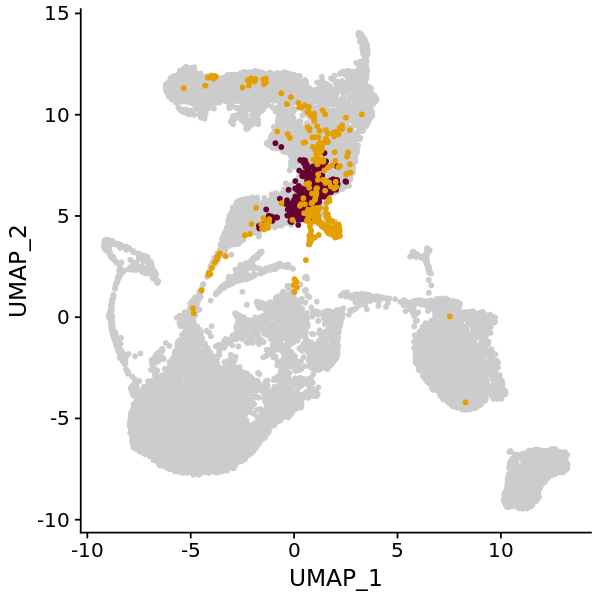

In [319]:
options(repr.plot.width=5, repr.plot.height=5)
Plot1<- DimPlot(so_VPtc_VPD30_HMembryo.combined,
                reduction = "umap",cells.highlight= list( TSC_tc, TB_early ),
                cols.highlight = c("#660033","#E69F00" ) ,pt.size =1,  label.size = 0.5, cols= "grey80") + NoLegend()
                                   
Plot1

In [320]:
pdf("Figures/FigS5B_UMAP_integration_timecourse_TSC_TC.pdf", width = 5, height = 5)
plot(Plot1)
dev.off()

png 
  2

## Correlation

In [89]:
Idents(so_VPtc_VPD30_HMembryo.combined)<- so_VPtc_VPD30_HMembryo.combined$Day.finalClusters

In [90]:
av.exp_RNA_woPrE<- AverageExpression(so_VPtc_VPD30_HMembryo.combined)$RNA

Removing cells with NA for 1 or more grouping variables



In [91]:
av.exp_RNA_woPrE_features<- av.exp_RNA_woPrE[which(row.names(av.exp_RNA_woPrE)%in% features),]

In [92]:
av.exp_RNA_woPrE_features_ <- cor(av.exp_RNA_woPrE_features, method= "spearman")

In [107]:
write.csv(av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)], "cor_av.exp_RNA_2000features_humanEmbryo_D30EXMC_tc.csv")

In [101]:
av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)]

,EightCells,"Pham, Panda 8CLC",B1_B2,Morula,Peimplantation Epiblast,Messmer Naive,"Pham, Panda Naive 1","Pham, Panda Naive 2",Intermediate Epiblast,ASECRIAV.intermediate.1,⋯,TB.medium3,TB.late,TB.apoptosis,Pre.EVT,EVT,Pre.ST,ST,Ectoderm,Erythrocytes,Hemogenic Endothelial Progenitors
EightCells,1.0000000,0.4605233,0.7084894,0.8053754,0.5072398,0.4905043,0.3985575,0.4083233,0.4480817,0.4171380,⋯,0.3674529,0.3367307,0.3997518,0.3548157,0.3116551,0.3171429,0.2967772,0.3084860,0.3365421,0.2706388
"Pham, Panda 8CLC",0.4605233,1.0000000,0.6118965,0.5647313,0.6811878,0.6463944,0.8275485,0.8639168,0.7615846,0.8770158,⋯,0.4750854,0.3858067,0.4908034,0.3930694,0.3539399,0.3519023,0.3204673,0.3685811,0.3804442,0.3187267
B1_B2,0.7084894,0.6118965,1.0000000,0.8952324,0.8207182,0.7115468,0.6259445,0.6505199,0.6426563,0.6457377,⋯,0.5247637,0.4932420,0.6285707,0.5082524,0.4665781,0.4432004,0.4382266,0.4214539,0.4216455,0.3789558
Morula,0.8053754,0.5647313,0.8952324,1.0000000,0.6986524,0.6415598,0.5532341,0.5676462,0.5690700,0.5661316,⋯,0.4482256,0.4288953,0.5329296,0.4454200,0.4098845,0.3880052,0.3777901,0.3621825,0.3907852,0.3421376
Peimplantation Epiblast,0.5072398,0.6811878,0.8207182,0.6986524,1.0000000,0.7756437,0.7235136,0.7282655,0.8054812,0.7344525,⋯,0.6036496,0.5341302,0.6649557,0.5383149,0.4818728,0.4887525,0.4674725,0.4665108,0.4209476,0.3935627
Messmer Naive,0.4905043,0.6463944,0.7115468,0.6415598,0.7756437,1.0000000,0.7309259,0.7378245,0.7200512,0.7121297,⋯,0.5229575,0.4912416,0.5718282,0.5027979,0.4694239,0.4504248,0.4316063,0.4486356,0.4306305,0.4106329
"Pham, Panda Naive 1",0.3985575,0.8275485,0.6259445,0.5532341,0.7235136,0.7309259,1.0000000,0.9198109,0.7402353,0.9060165,⋯,0.4631720,0.4117325,0.5032139,0.4150681,0.3900490,0.3778978,0.3482177,0.4322278,0.4135543,0.3921389
"Pham, Panda Naive 2",0.4083233,0.8639168,0.6505199,0.5676462,0.7282655,0.7378245,0.9198109,1.0000000,0.7472207,0.9473915,⋯,0.4930432,0.4515804,0.5479438,0.4545775,0.4298369,0.4066485,0.3802054,0.4359681,0.4209502,0.3943844
Intermediate Epiblast,0.4480817,0.7615846,0.6426563,0.5690700,0.8054812,0.7200512,0.7402353,0.7472207,1.0000000,0.7736591,⋯,0.6680459,0.5816226,0.6453210,0.5798466,0.5075212,0.5594401,0.5029564,0.4458007,0.4204260,0.3558208
ASECRIAV.intermediate.1,0.4171380,0.8770158,0.6457377,0.5661316,0.7344525,0.7121297,0.9060165,0.9473915,0.7736591,1.0000000,⋯,0.4831520,0.4438080,0.5440578,0.4502273,0.4230726,0.3975331,0.3685209,0.4647958,0.4357359,0.4119380


In [93]:
dim(av.exp_RNA_woPrE_features)

[1] 52 52

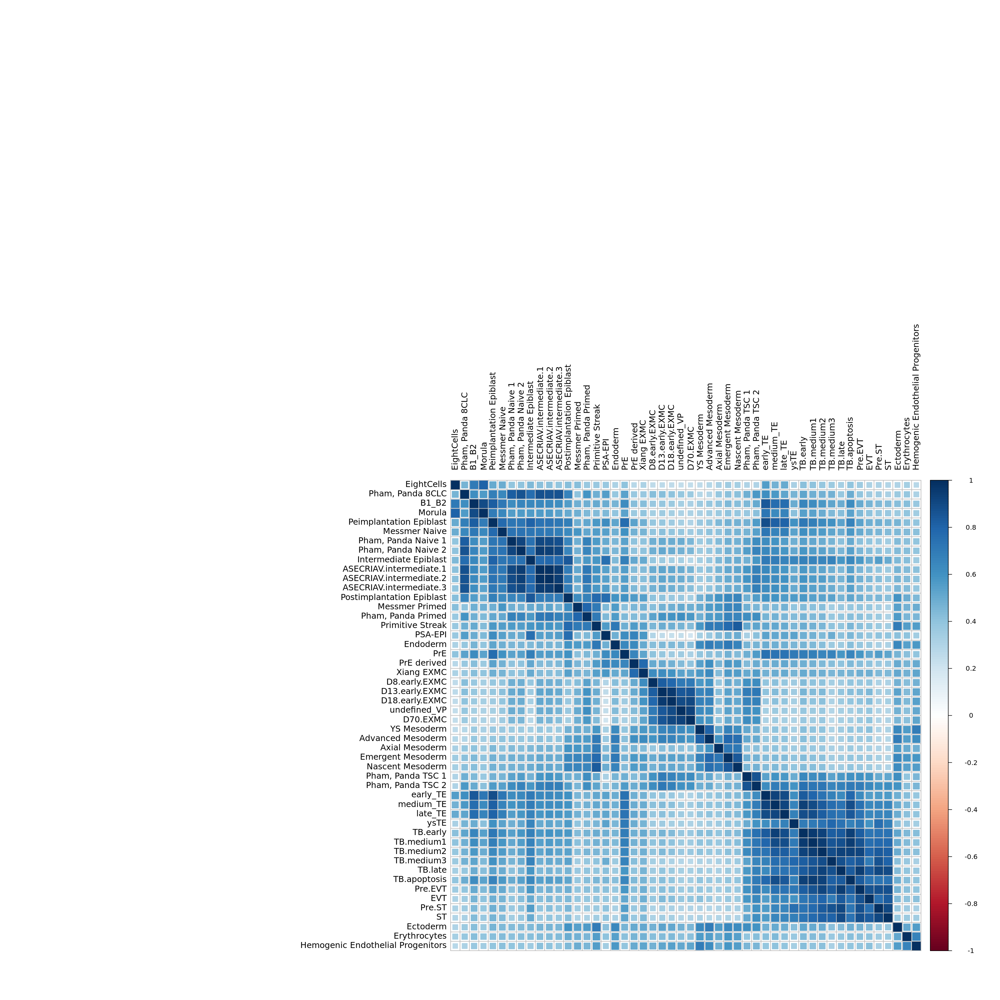

In [102]:
options(repr.plot.width = 20, repr.plot.height = 20, repr.plot.res = 150)
corrplot(av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)] , method = "square", tl.col="black")

In [108]:
pdf("Figures/FigS5C_Correlation_coeffient_humanEmbryo_D30EXMC_tc_RNA.pdf", width = 20, height = 20)
corrplot(av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)] , method = "square", tl.col="black")
dev.off()

png 
  2

In [104]:
options(repr.plot.width = 50, repr.plot.height = 50, repr.plot.res = 150)
corrplot(av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)], method="square",  
         addCoef.col = "black", # Add coefficient of correlation
         tl.col="black"
         )

In [105]:
pdf("Figures/FigS5C_Correlation_coeffient_humanEmbryo_D30EXMC_tc_RNA_number.pdf", width = 40, height = 40)
corrplot(av.exp_RNA_woPrE_features[-c(29,52),-c(29,52)], method="square",  
         addCoef.col = "black", # Add coefficient of correlation
         tl.col="black"
         )
dev.off()

png 
  2